
# **EXAMEN No 1.**
# * José Manuel Moreno - 201011998 *

# Situación Problema:
Actualmente, estamos ante la presencia de una variedad de fenómenos que están afectando el medio ambiente y que se reflejan en el calentamiento global, la contaminación del aire y la pérdida de biodiversidad, entre otros.
Establecer políticas que ataquen sus causas y el desarrollo de planes de gestión de riesgos que mitiguen sus efectos y permitan accionar oportunamente es uno de los grandes retos a los que nos enfrentamos como sociedad.
Uno de estos problemas está relacionado con el deterioro de la calidad de los cuerpos de agua, como consecuencia del desarrollo urbano no planificado y sin criterios de preservación del ambiente. Es preocupante observar cómo los ecosistemas acuáticos están siendo afectados por grandes obras de ingeniería, cambios en el uso de la tierra y la sobreexplotación de recursos, entre otros. Resulta necesario entonces implementar mecanismos que permitan monitorear y evaluar las variaciones en las características fisicoquímicas del agua, con el fin de preservar la calidad de vida de estos ecosistemas y garantizar la disponibilidad de agua dulce para la población humana.

# Objetivos a lograr:

* Aplicar técnicas de clasificación para construir modelos predictivos que permitan estimar la calidad del agua de una zona determinada.
* Determinar cuáles son los factores que más inciden en la contaminación de los cuerpos de agua con base en los datos.

# Nota sobre el conjunto de datos:
El conjunto de datos está relacionado con muestras de agua tomadas de diferentes fuentes, caracterizadas por variables fisicoquímicas y anotadas por los expertos, indicando cuáles son aptas para el consumo y cuáles no.




# 1. Exploración y Perfilamiento de Datos

In [240]:
# Instalacion de librerias
! pip install pandas
! pip install ydata-profiling
! pip install scikit-learn
! pip install sklearn_features
! pip install matplotlib
! pip install ipywidgets --upgrade
! pip install pyarrow
! pip install graphviz


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 3.5 MB/s eta 0:00:00


In [241]:
# Importar librerias 

# Data management 
import os
import time
import sys
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import cv2
import requests

# Data Modeling 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, MaxAbsScaler, LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline, FeatureUnion

from sklearn.experimental import enable_iterative_imputer   # Se utilizará para realizar imputación multivariable, 
                                                            # dado el alto % de valores perdidos en algunas variables.
from sklearn.impute import IterativeImputer
from sklearn_features.transformers import DataFrameSelector
from sklearn.compose import make_column_selector, ColumnTransformer

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier,  export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier  # Libreria para el modelo de Gradient Boosting
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.naive_bayes import BernoulliNB
from sklearn.decomposition import PCA # Análisis de componentes principales

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.model_selection import GridSearchCV # Búsqueda de hiperparámetros
from sklearn.model_selection import train_test_split # División de datos en entrenamiento y prueba

# Data visualization 
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz 

#Save the model
from joblib import dump, load


# Lectura de los Datos

In [242]:
path = 'https://raw.githubusercontent.com/JoseMoCa/ML_techniques/ed9678526ec29cd15012cf3917b4aa1f7dea6aba/Examen_1_JM/Datos_Examen_1.csv'
data = pd.read_csv(path, sep=';')
data.head()


,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,NaN,204.89,20791.32,7.30,368.52,564.31,10.38,86.99,2.96,NO
1,3.72,129.42,18630.06,6.64,NaN,592.89,15.18,56.33,4.50,NO
2,8.10,224.24,19909.54,9.28,NaN,418.61,16.87,66.42,3.06,NO
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,NO
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,NO


## Analisis de datos cargados: 
Se realiza la carga del DATASET de variables de calidad de agua, en donde se encuentra que los datos representan en sus registros a multiples muestras de agua tomadas de diferentes fuentes, y en sus columnas o variables unas 10 variables explicativas de la calidad.

Aunque no es explicito, se asume que la primera columna es el ID de la muestra, y por lo tanto nos permite diferenciar los registros. 

Por otra parte, se infiere que la variabla POTABILIDAD resultaría ser la variable a estimar o pronosticar, toda vez que esa variable determina la calidad de la agua tal que se encuentra apta para el consumo humano o no. 


In [243]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Resultados del Profiling de los datos: 

Del DATASET analizado con la herramienta de profiling, se puede concluir:

- Las variables PH y SULFATOS, mantienen un porcentaje alto de datos pérdidos, por lo cual se deberá tomar una decisión para tratar esos registros con información faltante; se revisará la opción de usar alguna herramienta de relleno de datos pérdidos.
- La variable TRIAHALOMETANOS, mantiene un valor bajo de datos pérdidos, por lo cual, resulta razonable aplicar una de dos decisiones: i) usar alguna técnica de relleno de datos, o ii) eliminar esos registros. Más adelante se analizará de fondo la decisión.
- La variable objetivo definida como: POTABILIDAD, presenta un cierto desbalance (40% SI, 60% NO), lo cual puede traer problemas para el modelamiento y pronostico. Se revisará una intervención de sobremuestro para corregir.

Se realiza la carga del DATASET de variables de calidad de agua, en donde se encuentra que los datos representan en sus registros a multiples muestras de agua tomadas de diferentes fuentes, y en sus columnas o variables unas 10 variables explicativas de la calidad.

Aunque no es explicito, se asume que la primera columna es el ID de la muestra, y por lo tanto nos permite diferenciar los registros. 

Por otra parte, se infiere que la variabla POTABILIDAD resultaría ser la variable a estimar o pronosticar, toda vez que esa variable determina la calidad de la agua tal que se encuentra apta para el consumo humano o no. 

# 2.  Limpieza y preparación de datos

Se procede a realizar el proceso de limpieza de datos con el fin de asegurar que los datos estén libres de errores, valores nulos, valores atípicos y formatos inconsistentes.

In [244]:
# Se procede a ajustar las variables categoricas, a ordinales:

estimators = [('encoder', OrdinalEncoder())]
pipe = Pipeline(estimators)
pipe

data_1 = pipe.fit_transform(data)
data_mod = pd.DataFrame(data_1,columns=data.columns)
data_mod1 = pd.DataFrame(data_1,columns=data.columns)
data_mod.head()


,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,NaN,1710.0,1619.0,381.0,1830.0,2927.0,237.0,2137.0,101.0,0.0
1,39.0,85.0,1283.0,315.0,NaN,3018.0,696.0,684.0,255.0,0.0
2,443.0,2277.0,1466.0,578.0,NaN,1501.0,860.0,1201.0,111.0,0.0
3,465.0,2020.0,1794.0,457.0,1661.0,747.0,1008.0,2348.0,268.0,0.0
4,541.0,882.0,1175.0,306.0,624.0,1219.0,346.0,58.0,213.0,0.0


In [245]:
# Se procederá a imputar lo valores con un mecanismo iterativo, multivariado, para efectos de que cada registro no considere solo la dinámica de 
# cada variable en si misma, si no que considere su relación con las demás variables - esto además ayuda a que no se sesgue al modelo, imputando por 
# valores más probables, o la media de la muestra.

imp = IterativeImputer(max_iter=10, random_state=77)
imp.fit(data_mod)
IterativeImputer(random_state=77)

data_mod1 = np.round(imp.transform(data_mod), decimals=2)
data_mod1 = pd.DataFrame(data_mod1, columns=data_mod.columns)
data_mod1.head()


,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,351.89,1710.0,1619.0,381.0,1830.00,2927.0,237.0,2137.0,101.0,0.0
1,39.00,85.0,1283.0,315.0,1275.67,3018.0,696.0,684.0,255.0,0.0
2,443.00,2277.0,1466.0,578.0,1118.47,1501.0,860.0,1201.0,111.0,0.0
3,465.00,2020.0,1794.0,457.0,1661.00,747.0,1008.0,2348.0,268.0,0.0
4,541.00,882.0,1175.0,306.0,624.00,1219.0,346.0,58.0,213.0,0.0


In [246]:
# Se trae la data original para verificar el tratamiento de las variables imputadas, para rellenar datos vacios:
data_mod.head()

,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,NaN,1710.0,1619.0,381.0,1830.0,2927.0,237.0,2137.0,101.0,0.0
1,39.0,85.0,1283.0,315.0,NaN,3018.0,696.0,684.0,255.0,0.0
2,443.0,2277.0,1466.0,578.0,NaN,1501.0,860.0,1201.0,111.0,0.0
3,465.0,2020.0,1794.0,457.0,1661.0,747.0,1008.0,2348.0,268.0,0.0
4,541.0,882.0,1175.0,306.0,624.0,1219.0,346.0,58.0,213.0,0.0


In [247]:
# Se procede a analizar si existe colinealidad entre las variables:
estimators = [('imputer', SimpleImputer(strategy='most_frequent'))
              ]
pipe = Pipeline(estimators)
pipe

collinearity_pipe = pipe.fit_transform(data_mod1)
collinearity_Data = pd.DataFrame(collinearity_pipe,columns=data_mod1.columns)
collinearity_Data.head()

,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,351.89,1710.0,1619.0,381.0,1830.00,2927.0,237.0,2137.0,101.0,0.0
1,39.00,85.0,1283.0,315.0,1275.67,3018.0,696.0,684.0,255.0,0.0
2,443.00,2277.0,1466.0,578.0,1118.47,1501.0,860.0,1201.0,111.0,0.0
3,465.00,2020.0,1794.0,457.0,1661.00,747.0,1008.0,2348.0,268.0,0.0
4,541.00,882.0,1175.0,306.0,624.00,1219.0,346.0,58.0,213.0,0.0


In [248]:
# Ahora, se evalua la colinealidad de las variables:
corr = collinearity_Data.corr()
corr.style.background_gradient(cmap='coolwarm')


,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
pH,1.000000,0.116907,-0.089081,-0.039050,0.029287,0.017537,0.042387,0.001598,-0.038144,-0.005252
Dureza,0.116907,1.000000,-0.052566,-0.022143,-0.106452,-0.032864,0.002120,-0.012089,-0.013222,-0.011153
Sólidos,-0.089081,-0.052566,1.000000,-0.066366,-0.173938,0.020850,0.014942,-0.018811,0.025628,0.026234
Cloraminas,-0.039050,-0.022143,-0.066366,1.000000,0.031139,-0.018190,-0.014117,0.016154,-0.000979,0.023475
Sulfatos,0.029287,-0.106452,-0.173938,0.031139,1.000000,-0.024189,0.020438,-0.034269,-0.015332,-0.013862
Conductividad,0.017537,-0.032864,0.020850,-0.018190,-0.024189,1.000000,0.019767,-0.003383,0.010702,-0.010421
Carbono_orgánico,0.042387,0.002120,0.014942,-0.014117,0.020438,0.019767,1.000000,-0.008468,-0.028970,-0.027102
Trihalometanos,0.001598,-0.012089,-0.018811,0.016154,-0.034269,-0.003383,-0.008468,1.000000,-0.025179,0.005561
Turbidez,-0.038144,-0.013222,0.025628,-0.000979,-0.015332,0.010702,-0.028970,-0.025179,1.000000,0.001723
Potabilidad,-0.005252,-0.011153,0.026234,0.023475,-0.013862,-0.010421,-0.027102,0.005561,0.001723,1.000000


* Se encuentra que no existe mayor grado de correlacion entre algun par de variables. Por tanto se descarta la colinealidad entre las variables del conjunto de datos. Esto tambien puede llevar a problemas de predicción, dado que parece que no hay relación entre las variables explicativas y la variable objetivo. La correlación entre la variable objetivo y las demás, es muy cercana a cero.

In [249]:
# Se procede a separar los datos por train y test
train, test = train_test_split(data_mod1, test_size=0.2, random_state=77)
train.head()

X_train = train.drop(['Potabilidad'],axis=1)
Y_train = train['Potabilidad']

X_test = test.drop(['Potabilidad'],axis=1)
Y_test = test['Potabilidad']

Y_train
X_train

ProfileReport(X_train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3.  Estimación de Modelo de Regresión Logística

In [250]:
# Procedo a construir el pipeline para evaluar las mejores transformaciones de la data
preprocessor = ColumnTransformer(
    transformers=[
        ('normalize', MaxAbsScaler(), make_column_selector(dtype_include=np.number))
    ],
    remainder='passthrough'
)

estimators = [
    ('preprocessor', preprocessor),
    ('clf', LogisticRegression(solver='liblinear'))
]
pipe = Pipeline(estimators)
pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('normalize', MaxAbsScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                ('clf', LogisticRegression(solver='liblinear'))])

In [251]:
# Se selecciona la grilla de parámetros para el modelo
param_grid = {
    'preprocessor__normalize': ['passthrough', MaxAbsScaler(), MinMaxScaler(feature_range=(0, 1))]
}

grid_search = GridSearchCV(pipe, param_grid=param_grid,cv=5,verbose=3,scoring='recall_weighted')
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 2/5] END preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 3/5] END preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 4/5] END preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 5/5] END preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 1/5] END preprocessor__normalize=MaxAbsScaler();, score=0.609 total time=   0.0s
[CV 2/5] END preprocessor__normalize=MaxAbsScaler();, score=0.609 total time=   0.0s
[CV 3/5] END preprocessor__normalize=MaxAbsScaler();, score=0.609 total time=   0.0s
[CV 4/5] END preprocessor__normalize=MaxAbsScaler();, score=0.609 total time=   0.0s
[CV 5/5] END preprocessor__normalize=MaxAbsScaler();, score=0.609 total time=   0.0s
[CV 1/5] END preprocessor__normalize=MinMaxScaler();, score=0.609 total time=   0.0s
[CV 2/5] END preproc

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf',
                                        LogisticRegression(solver='liblinear'))]),
             param_grid={'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [252]:
# Se busca cual fue el resultado de mejores parámetros
print(grid_search.best_params_)


{'preprocessor__normalize': 'passthrough'}


In [253]:
# Se encuentra que el mejor parámetro es no hacer nada; lo cual es extraño dado que el modelo parece no predecir nada diferente a la muestra
#

resultados = pd.DataFrame(grid_search.cv_results_)
display(resultados)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__normalize,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005285,0.002631,0.001912,0.000284,passthrough,{'preprocessor__normalize': 'passthrough'},0.608779,0.608779,0.608779,0.608779,0.608779,0.608779,0.0,1
1,0.003617,0.000163,0.001965,0.000042,MaxAbsScaler(),{'preprocessor__normalize': MaxAbsScaler()},0.608779,0.608779,0.608779,0.608779,0.608779,0.608779,0.0,1
2,0.003581,0.000071,0.001940,0.000032,MinMaxScaler(),{'preprocessor__normalize': MinMaxScaler()},0.608779,0.608779,0.608779,0.608779,0.608779,0.608779,0.0,1


In [254]:
dump(grid_search.best_estimator_, 'passthrough.joblib')

['passthrough.joblib']

In [255]:
model = load('passthrough.joblib')

In [256]:
pred_train = model.predict(X_train)
display(pred_train)

array([0., 0., 0., ..., 0., 0., 0.])

Efectivamente se encuentra que el modelo no esta pronosticando la categoria SI en potabilidad.


In [257]:
pred_test = model.predict(X_test)
display(pred_test)
conf_matrix = confusion_matrix(Y_test, pred_test)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot(cmap='Blues', values_format='d')
# Añade etiquetas y muestra el gráfico
#plt.title('Matriz de Confusión')
#plt.show()


array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

En aras de mejorar el modelo, se procede a establecer un mecanismo de sobremuestro que nivele el desbalance en la variable objetivo. 
No se utiliza submuestreo para efectos de no reducir el conjunto de datos, dado que el conjunto de informacion no estan grande.

In [258]:
 # Técnica de sobremuestreo

from sklearn.utils import resample

# Separar el conjunto de datos por clases
data_majority = data_mod1[data_mod1.Potabilidad == 0]
data_minority = data_mod1[data_mod1.Potabilidad != 0]

# Sobremuestrear la clase minoritaria
data_minority_upsampled = resample(data_minority, 
                                   replace=True,     # Muestra con reemplazo
                                   n_samples=len(data_majority),    # Para coincidir con la clase mayoritaria
                                   random_state=77) # Reproducibilidad

# Combinar la clase mayoritaria con la clase minoritaria sobremuestreada
data_upsampled = pd.concat([data_majority, data_minority_upsampled])

# Verificar la nueva distribución de clases
data_upsampled.Potabilidad.value_counts()
data_upsampled.head()


,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez,Potabilidad
0,351.89,1710.0,1619.0,381.0,1830.00,2927.0,237.0,2137.0,101.0,0.0
1,39.00,85.0,1283.0,315.0,1275.67,3018.0,696.0,684.0,255.0,0.0
2,443.00,2277.0,1466.0,578.0,1118.47,1501.0,860.0,1201.0,111.0,0.0
3,465.00,2020.0,1794.0,457.0,1661.00,747.0,1008.0,2348.0,268.0,0.0
4,541.00,882.0,1175.0,306.0,624.00,1219.0,346.0,58.0,213.0,0.0


In [259]:
# Ahora se ajustará el modelo, con la data sobremuestreada:

# Se procede a separar los datos por train y test
train, test = train_test_split(data_upsampled, test_size=0.2, random_state=77)
train.head()

X_train = train.drop(['Potabilidad'],axis=1)
Y_train = train['Potabilidad']

X_test = test.drop(['Potabilidad'],axis=1)
Y_test = test['Potabilidad']


In [260]:
grid_search.fit(X_train, Y_train)


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END preprocessor__normalize=passthrough;, score=0.495 total time=   0.0s
[CV 2/5] END preprocessor__normalize=passthrough;, score=0.529 total time=   0.0s
[CV 3/5] END preprocessor__normalize=passthrough;, score=0.512 total time=   0.0s
[CV 4/5] END preprocessor__normalize=passthrough;, score=0.546 total time=   0.0s
[CV 5/5] END preprocessor__normalize=passthrough;, score=0.534 total time=   0.0s
[CV 1/5] END preprocessor__normalize=MaxAbsScaler();, score=0.492 total time=   0.0s
[CV 2/5] END preprocessor__normalize=MaxAbsScaler();, score=0.526 total time=   0.0s
[CV 3/5] END preprocessor__normalize=MaxAbsScaler();, score=0.507 total time=   0.0s
[CV 4/5] END preprocessor__normalize=MaxAbsScaler();, score=0.545 total time=   0.0s
[CV 5/5] END preprocessor__normalize=MaxAbsScaler();, score=0.532 total time=   0.0s
[CV 1/5] END preprocessor__normalize=MinMaxScaler();, score=0.492 total time=   0.0s
[CV 2/5] END preproc

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf',
                                        LogisticRegression(solver='liblinear'))]),
             param_grid={'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [261]:
# Ahora se encuentra que el modelo realiza estimaciones para las 2 categorias, el score demuestra que esta operando mejor el modelo; 
# sin embargo, el score es demasiado bajo, no supera el 55%

print(grid_search.best_params_)
resultados = pd.DataFrame(grid_search.cv_results_)
display(resultados)


{'preprocessor__normalize': 'passthrough'}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__normalize,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.008350,0.006077,0.002364,0.000337,passthrough,{'preprocessor__normalize': 'passthrough'},0.495312,0.528951,0.511737,0.546166,0.533646,0.523163,0.017769,1
1,0.006650,0.002716,0.003422,0.001250,MaxAbsScaler(),{'preprocessor__normalize': MaxAbsScaler()},0.492188,0.525822,0.507042,0.544601,0.532081,0.520347,0.018579,2
2,0.017373,0.025090,0.006277,0.005292,MinMaxScaler(),{'preprocessor__normalize': MinMaxScaler()},0.492188,0.525822,0.507042,0.544601,0.532081,0.520347,0.018579,2


In [262]:
dump(grid_search.best_estimator_, 'passthrough.joblib')
model = load('passthrough.joblib')


In [263]:
pred_test_R = model.predict(X_test)
pred_train_R = model.predict(X_train)

In [264]:
print('---------------Reporte para el Modelo 1 - Reg Logistica - TEST------------')
print(classification_report(Y_test,pred_test_R))

---------------Reporte para el Modelo 1 - Reg Logistica - TEST------------
              precision    recall  f1-score   support

         0.0       0.53      0.45      0.49       420
         1.0       0.48      0.55      0.51       380

    accuracy                           0.50       800
   macro avg       0.50      0.50      0.50       800
weighted avg       0.50      0.50      0.50       800



In [265]:
print('---------------Reporte para el Modelo 1 - Reg Logistica - TRAIN------------')
print(classification_report(Y_train,pred_train_R))

---------------Reporte para el Modelo 1 - Reg Logistica - TRAIN------------
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.50      1578
         1.0       0.54      0.61      0.57      1618

    accuracy                           0.54      3196
   macro avg       0.54      0.54      0.53      3196
weighted avg       0.54      0.54      0.53      3196



Con esto, se muestra que sin ajustar hiperparametros, el modelo no resulta explicativo y el poder de predicción es bajo:


In [266]:
# Ajuste de hiperparametros: 

In [267]:
# Se selecciona la grilla de parámetros para el modelo considerando PARAMETRO REGULARIZACION C con valores [0.1, 0.5, 1]  
param_grid_RC = {
    'preprocessor__normalize': ['passthrough', MaxAbsScaler(), MinMaxScaler(feature_range=(0, 1))],
    'clf__C': [0.1, 0.5, 1]  
}

grid_search_RC = GridSearchCV(pipe, param_grid=param_grid_RC,cv=5,verbose=3,scoring='recall_weighted')
grid_search_RC.fit(X_train, Y_train)



Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END clf__C=0.1, preprocessor__normalize=passthrough;, score=0.491 total time=   0.0s
[CV 2/5] END clf__C=0.1, preprocessor__normalize=passthrough;, score=0.529 total time=   0.0s
[CV 3/5] END clf__C=0.1, preprocessor__normalize=passthrough;, score=0.512 total time=   0.0s
[CV 4/5] END clf__C=0.1, preprocessor__normalize=passthrough;, score=0.546 total time=   0.0s
[CV 5/5] END clf__C=0.1, preprocessor__normalize=passthrough;, score=0.534 total time=   0.0s
[CV 1/5] END clf__C=0.1, preprocessor__normalize=MaxAbsScaler();, score=0.492 total time=   0.0s
[CV 2/5] END clf__C=0.1, preprocessor__normalize=MaxAbsScaler();, score=0.532 total time=   0.0s
[CV 3/5] END clf__C=0.1, preprocessor__normalize=MaxAbsScaler();, score=0.512 total time=   0.0s
[CV 4/5] END clf__C=0.1, preprocessor__normalize=MaxAbsScaler();, score=0.545 total time=   0.0s
[CV 5/5] END clf__C=0.1, preprocessor__normalize=MaxAbsScaler();, score=0.534 tota

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf',
                                        LogisticRegression(solver='liblinear'))]),
             param_grid={'clf__C': [0.1, 0.5, 1],
                         'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [268]:
resultados_RC = pd.DataFrame(grid_search_RC.cv_results_)
display(resultados_RC)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__C,param_preprocessor__normalize,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.009886,0.002625,0.004133,0.001609,0.1,passthrough,"{'clf__C': 0.1, 'preprocessor__normalize': 'pa...",0.490625,0.528951,0.511737,0.546166,0.533646,0.522225,0.019274,5
1,0.005996,0.001124,0.002962,0.000317,0.1,MaxAbsScaler(),"{'clf__C': 0.1, 'preprocessor__normalize': Max...",0.492188,0.532081,0.511737,0.544601,0.533646,0.522851,0.018647,2
2,0.004204,0.000465,0.002329,0.000084,0.1,MinMaxScaler(),"{'clf__C': 0.1, 'preprocessor__normalize': Min...",0.492188,0.532081,0.511737,0.544601,0.533646,0.522851,0.018647,2
3,0.007458,0.002526,0.003128,0.001661,0.5,passthrough,"{'clf__C': 0.5, 'preprocessor__normalize': 'pa...",0.493750,0.528951,0.511737,0.546166,0.533646,0.522850,0.018263,4
4,0.005342,0.001510,0.003191,0.001249,0.5,MaxAbsScaler(),"{'clf__C': 0.5, 'preprocessor__normalize': Max...",0.490625,0.528951,0.507042,0.544601,0.532081,0.520660,0.019287,6
5,0.003815,0.000236,0.002014,0.000102,0.5,MinMaxScaler(),"{'clf__C': 0.5, 'preprocessor__normalize': Min...",0.490625,0.528951,0.507042,0.544601,0.532081,0.520660,0.019287,6
6,0.005506,0.001637,0.001921,0.000196,1,passthrough,"{'clf__C': 1, 'preprocessor__normalize': 'pass...",0.495312,0.528951,0.511737,0.546166,0.533646,0.523163,0.017769,1
7,0.004417,0.000393,0.002572,0.000345,1,MaxAbsScaler(),"{'clf__C': 1, 'preprocessor__normalize': MaxAb...",0.492188,0.525822,0.507042,0.544601,0.532081,0.520347,0.018579,8
8,0.004432,0.000494,0.002445,0.000330,1,MinMaxScaler(),"{'clf__C': 1, 'preprocessor__normalize': MinMa...",0.492188,0.525822,0.507042,0.544601,0.532081,0.520347,0.018579,8


In [269]:
print(grid_search_RC.best_params_)

{'clf__C': 1, 'preprocessor__normalize': 'passthrough'}


In [270]:
dump(grid_search_RC.best_estimator_, 'passthrough_RC.joblib')

['passthrough_RC.joblib']

In [271]:
model_RC = load('passthrough_RC.joblib')

In [272]:
pred_test_RC = model_RC.predict(X_test)
pred_train_RC = model_RC.predict(X_train)

In [273]:
print('---------------Reporte para el Modelo 1 - Reg Log Hiper C TEST------------')
print(classification_report(Y_test,pred_test_RC))

---------------Reporte para el Modelo 1 - Reg Log Hiper C TEST------------
              precision    recall  f1-score   support

         0.0       0.53      0.45      0.49       420
         1.0       0.48      0.55      0.51       380

    accuracy                           0.50       800
   macro avg       0.50      0.50      0.50       800
weighted avg       0.50      0.50      0.50       800



In [274]:
print('---------------Reporte para el Modelo 1 - Reg Log Hiper C TRAIN------------')
print(classification_report(Y_train,pred_train_RC))

---------------Reporte para el Modelo 1 - Reg Log Hiper C TRAIN------------
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.50      1578
         1.0       0.54      0.61      0.57      1618

    accuracy                           0.54      3196
   macro avg       0.54      0.54      0.53      3196
weighted avg       0.54      0.54      0.53      3196



In [275]:
# Se encuentra que para la muestra seleccionada, el modelo de Regresión Logística se ajusta parcialmente, 
# y logra un poder explicativo bajo.

# 4.  Estimación de Modelo de ARBOLES DE DECISIÓN

In [276]:
# Procedo a construir el pipeline para evaluar las mejores transformaciones de la data, 
# e incluir el parámetros BALANCED para el peso entre clases

estimators_A = [
    ('preprocessor', preprocessor),
        ('clf', DecisionTreeClassifier(random_state=77, class_weight='balanced'))
]
pipe_A = Pipeline(estimators_A)
pipe_A


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('normalize', MaxAbsScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced',
                                        random_state=77))])

In [277]:
# Procedo a construir la grilla de parámetros para evaluar las condiciones del ejercicio
param_grid_A = {
    'preprocessor__normalize': ['passthrough', MaxAbsScaler(), MinMaxScaler(feature_range=(0, 1))],
    'clf__criterion': ['gini', 'entropy'],
    'clf__max_depth': [4, 6, 8, 10],
    'clf__min_samples_split': [3, 4, 5]
}

grid_search_A = GridSearchCV(pipe_A, param_grid=param_grid_A, cv=5, verbose=3, scoring='recall_weighted')

grid_search_A.fit(X_train, Y_train)




Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=passthrough;, score=0.562 total time=   0.0s
[CV 2/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=passthrough;, score=0.609 total time=   0.0s
[CV 3/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=passthrough;, score=0.541 total time=   0.0s
[CV 4/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=passthrough;, score=0.571 total time=   0.0s
[CV 5/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=passthrough;, score=0.560 total time=   0.0s
[CV 1/5] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_split=3, preprocessor__normalize=MaxAbsScaler();, score=0.562 total time=   0.0s
[CV 2/5] END clf__criterion=gini, clf__max_depth=4, c

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf',
                                        DecisionTreeClassifier(class_weight='balanced',
                                                               random_state=77))]),
             param_grid={'clf__criterion': ['gini', 'entropy'],
                         'clf__max_depth': [4, 6, 8, 10],
                         'clf__min_samples_split': [3, 4, 5],
                         'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [278]:
resultados_A = pd.DataFrame(grid_search_A.cv_results_)
display(resultados_A)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__criterion,param_clf__max_depth,param_clf__min_samples_split,param_preprocessor__normalize,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.014613,0.003491,0.003038,0.000416,gini,4,3,passthrough,"{'clf__criterion': 'gini', 'clf__max_depth': 4...",0.5625,0.608764,0.541471,0.571205,0.560250,0.568838,0.022192,64
1,0.012546,0.002257,0.003049,0.000757,gini,4,3,MaxAbsScaler(),"{'clf__criterion': 'gini', 'clf__max_depth': 4...",0.5625,0.608764,0.541471,0.571205,0.560250,0.568838,0.022192,64
2,0.010842,0.000599,0.002752,0.000443,gini,4,3,MinMaxScaler(),"{'clf__criterion': 'gini', 'clf__max_depth': 4...",0.5625,0.608764,0.541471,0.571205,0.560250,0.568838,0.022192,64
3,0.010129,0.000232,0.002401,0.000204,gini,4,4,passthrough,"{'clf__criterion': 'gini', 'clf__max_depth': 4...",0.5625,0.608764,0.541471,0.571205,0.560250,0.568838,0.022192,64
4,0.009992,0.000434,0.002430,0.000260,gini,4,4,MaxAbsScaler(),"{'clf__criterion': 'gini', 'clf__max_depth': 4...",0.5625,0.608764,0.541471,0.571205,0.560250,0.568838,0.022192,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0.022395,0.000576,0.002574,0.000469,entropy,10,4,MaxAbsScaler(),"{'clf__criterion': 'entropy', 'clf__max_depth'...",0.6500,0.647887,0.627543,0.618153,0.640063,0.636729,0.012175,10
68,0.022787,0.000580,0.002433,0.000203,entropy,10,4,MinMaxScaler(),"{'clf__criterion': 'entropy', 'clf__max_depth'...",0.6500,0.647887,0.627543,0.618153,0.640063,0.636729,0.012175,10
69,0.022125,0.001010,0.002229,0.000263,entropy,10,5,passthrough,"{'clf__criterion': 'entropy', 'clf__max_depth'...",0.6500,0.643192,0.627543,0.618153,0.640063,0.635790,0.011437,16
70,0.022522,0.000595,0.002369,0.000296,entropy,10,5,MaxAbsScaler(),"{'clf__criterion': 'entropy', 'clf__max_depth'...",0.6500,0.643192,0.627543,0.618153,0.640063,0.635790,0.011437,16


In [279]:
print(grid_search_A.best_params_)


{'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__min_samples_split': 4, 'preprocessor__normalize': 'passthrough'}


In [280]:
dump(grid_search_A.best_estimator_, 'passthrough_A.joblib')
model_A = load('passthrough_A.joblib')


In [281]:
pred_test_A = model_A.predict(X_test)
pred_train_A = model_A.predict(X_train)

In [282]:
print('---------------Reporte para el Modelo 2 - Arboles Decisión - TEST------------')
print(classification_report(Y_test,pred_test_A))

---------------Reporte para el Modelo 2 - Arboles Decisión - TEST------------
              precision    recall  f1-score   support

         0.0       0.69      0.63      0.66       420
         1.0       0.63      0.69      0.66       380

    accuracy                           0.66       800
   macro avg       0.66      0.66      0.66       800
weighted avg       0.66      0.66      0.66       800



In [283]:
print('---------------Reporte para el Modelo 2 - Arboles Decisión - TRAIN------------')
print(classification_report(Y_train,pred_train_A))

---------------Reporte para el Modelo 2 - Arboles Decisión - TRAIN------------
              precision    recall  f1-score   support

         0.0       0.79      0.78      0.78      1578
         1.0       0.79      0.79      0.79      1618

    accuracy                           0.79      3196
   macro avg       0.79      0.79      0.79      3196
weighted avg       0.79      0.79      0.79      3196



* Se tienen unos mejores resultados para el algoritmo de Arboles de Decisión, con profundidad de 10, muestras mínimas de 4, y criterio GINI, en donde se logran indicadores de precisión y de sensibilidad superiores al 63% para la muestra TEST.

# 5.  Estimación de Modelo de K vecinos cercanos:

In [284]:
# Procedo a construir el pipeline para evaluar las mejores transformaciones de la data
estimators_K = [
    ('preprocessor', preprocessor),
    ('clf', KNeighborsClassifier())
]
pipe_K = Pipeline(estimators_K)


In [285]:
# Procedo a construir la grilla de parámetros para evaluar las condiciones del ejercicio
param_grid_K = {
    'preprocessor__normalize': ['passthrough', MaxAbsScaler(), MinMaxScaler(feature_range=(0, 1))],
    'clf__n_neighbors': [1, 2, 3, 4, 5]  # Espacio de búsqueda para el valor de K
}

grid_search_K = GridSearchCV(pipe_K, param_grid=param_grid_K, cv=5, verbose=3, scoring='recall_weighted')

grid_search_K.fit(X_train, Y_train)



Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV 1/5] END clf__n_neighbors=1, preprocessor__normalize=passthrough;, score=0.720 total time=   0.0s
[CV 2/5] END clf__n_neighbors=1, preprocessor__normalize=passthrough;, score=0.748 total time=   0.0s
[CV 3/5] END clf__n_neighbors=1, preprocessor__normalize=passthrough;, score=0.710 total time=   0.0s
[CV 4/5] END clf__n_neighbors=1, preprocessor__normalize=passthrough;, score=0.728 total time=   0.0s
[CV 5/5] END clf__n_neighbors=1, preprocessor__normalize=passthrough;, score=0.717 total time=   0.0s
[CV 1/5] END clf__n_neighbors=1, preprocessor__normalize=MaxAbsScaler();, score=0.730 total time=   0.0s
[CV 2/5] END clf__n_neighbors=1, preprocessor__normalize=MaxAbsScaler();, score=0.750 total time=   0.0s
[CV 3/5] END clf__n_neighbors=1, preprocessor__normalize=MaxAbsScaler();, score=0.725 total time=   0.0s
[CV 4/5] END clf__n_neighbors=1, preprocessor__normalize=MaxAbsScaler();, score=0.750 total time=   0.0s
[CV 5/5] 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf', KNeighborsClassifier())]),
             param_grid={'clf__n_neighbors': [1, 2, 3, 4, 5],
                         'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [286]:
print(grid_search_K.best_params_)


{'clf__n_neighbors': 1, 'preprocessor__normalize': MaxAbsScaler()}


In [287]:
dump(grid_search_K.best_estimator_, 'passthrough_K.joblib')
model_K = load('passthrough_K.joblib')


In [288]:
pred_test_K = model_K.predict(X_test)
pred_train_K = model_K.predict(X_train)


In [289]:
print('---------------Reporte para el Modelo 3 - KNN -  TEST------------')
print(classification_report(Y_test,pred_test_K))


---------------Reporte para el Modelo 3 - KNN -  TEST------------
              precision    recall  f1-score   support

         0.0       0.86      0.70      0.77       420
         1.0       0.72      0.88      0.79       380

    accuracy                           0.78       800
   macro avg       0.79      0.79      0.78       800
weighted avg       0.80      0.78      0.78       800



In [290]:
print('---------------Reporte para el Modelo 3 - KNN - TRAIN------------')
print(classification_report(Y_train,pred_train_K))

---------------Reporte para el Modelo 3 - KNN - TRAIN------------
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1578
         1.0       1.00      1.00      1.00      1618

    accuracy                           1.00      3196
   macro avg       1.00      1.00      1.00      3196
weighted avg       1.00      1.00      1.00      3196



* Se tienen unos mejores resultados hasta el momento, en donde con KNN con K=1, se logran indicadores de precisión y de sensibilidad superiores al 86% para la muestra TEST.

# 6.  Estimación de Modelo usando Naïve Bayes.

In [291]:
# Procedo a construir el pipeline para evaluar las mejores transformaciones de la data
estimators_B = [
    ('preprocessor', preprocessor),
    ('clf', BernoulliNB())
]
pipe_B = Pipeline(estimators_B)
pipe_B


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('normalize', MaxAbsScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                ('clf', BernoulliNB())])

In [292]:
X_train

,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez
3130,447.0,291.0,3265.0,435.0,562.00,1568.0,612.0,1127.0,241.0
1364,278.0,467.0,1006.0,167.0,248.00,1206.0,852.0,1965.0,138.0
797,370.0,1983.0,1248.0,480.0,370.00,2460.0,250.0,2296.0,186.0
3026,498.0,303.0,853.0,302.0,2246.00,1870.0,645.0,401.0,132.0
843,420.0,1008.0,896.0,383.0,1206.98,2562.0,303.0,2167.0,179.0
...,...,...,...,...,...,...,...,...,...
3201,186.0,1817.0,3123.0,305.0,1709.00,1628.0,1040.0,921.0,138.0
3139,469.0,454.0,3007.0,421.0,771.00,1315.0,94.0,1262.0,242.0
1215,430.0,337.0,2415.0,127.0,1151.28,1993.0,101.0,517.0,122.0
927,308.0,1665.0,2334.0,488.0,1365.00,982.0,1096.0,767.0,181.0


In [293]:
data_upsampled.Potabilidad.value_counts()

Potabilidad
0.0    1998
1.0    1998
Name: count, dtype: int64

In [294]:
# Construyendo la grilla de parámetros para BernoulliNB
param_grid_B = {
    'preprocessor__normalize': ['passthrough', MaxAbsScaler(), MinMaxScaler(feature_range=(0, 1))],
    'clf__alpha': [0.01, 0.1, 1.0, 10.0],  # Valores de alpha para explorar
    'clf__class_prior': [[0.5, 0.5]]  # Ajustando la referencia de class_prior correctamente
}

grid_search_B = GridSearchCV(pipe_B, param_grid=param_grid_B, cv=5, verbose=3, scoring='recall_weighted')

grid_search_B.fit(X_train, Y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=passthrough;, score=0.495 total time=   0.0s
[CV 2/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=passthrough;, score=0.495 total time=   0.0s
[CV 3/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=passthrough;, score=0.493 total time=   0.0s
[CV 4/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=passthrough;, score=0.501 total time=   0.0s
[CV 5/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=passthrough;, score=0.495 total time=   0.0s
[CV 1/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=MaxAbsScaler();, score=0.495 total time=   0.0s
[CV 2/5] END clf__alpha=0.01, clf__class_prior=[0.5, 0.5], preprocessor__normalize=MaxAbsScaler();, score=0.495 total time=   0.0s
[CV 3/5] END clf__alpha=0.01, clf__cl

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('normalize',
                                                                         MaxAbsScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x182aed590>)])),
                                       ('clf', BernoulliNB())]),
             param_grid={'clf__alpha': [0.01, 0.1, 1.0, 10.0],
                         'clf__class_prior': [[0.5, 0.5]],
                         'preprocessor__normalize': ['passthrough',
                                                     MaxAbsScaler(),
                                                     MinMaxScaler()]},
             scoring='recall_weighted', verbose=3)

In [295]:
print(grid_search_B.best_params_)

{'clf__alpha': 10.0, 'clf__class_prior': [0.5, 0.5], 'preprocessor__normalize': 'passthrough'}


In [296]:
dump(grid_search_B.best_estimator_, 'passthrough_B.joblib')
model_B = load('passthrough_B.joblib')

In [297]:
pred_test_B = model_B.predict(X_test)
pred_train_B = model_B.predict(X_train)

In [298]:
print('---------------Reporte para el Modelo 4 - Naive Bayes Bernoulli - TEST------------')
print(classification_report(Y_test,pred_test_B,zero_division=0))

---------------Reporte para el Modelo 4 - Naive Bayes Bernoulli - TEST------------
              precision    recall  f1-score   support

         0.0       1.00      0.00      0.00       420
         1.0       0.48      1.00      0.64       380

    accuracy                           0.48       800
   macro avg       0.74      0.50      0.32       800
weighted avg       0.75      0.48      0.31       800



In [299]:
print('---------------Reporte para el Modelo 1 - Naive Bayes Bernoulli - TRAIN------------')
print(classification_report(Y_train,pred_train_B,zero_division=0))

---------------Reporte para el Modelo 1 - Naive Bayes Bernoulli - TRAIN------------
              precision    recall  f1-score   support

         0.0       1.00      0.00      0.01      1578
         1.0       0.51      1.00      0.67      1618

    accuracy                           0.51      3196
   macro avg       0.75      0.50      0.34      3196
weighted avg       0.75      0.51      0.34      3196



# 7. Tabla de Resultados Comparativos entre MODELOS:
Se presenta una tabla comparativa mostrando el rendimiento sobre test de los tres modelos seleccionados (con mejores rendimientos) de las actividades 3, 4, 5 y 6, sobre las métricas exactitud, recall, precisión y F-score.

In [300]:
# Calcular de métricas por modelo, y tabla comparativa: 

# Reg Logistica con Hiperparametro Optimizado
accuracy_R = accuracy_score(Y_test, pred_test_RC)
recall_R = recall_score(Y_test, pred_test_RC, average='binary')
precision_R = precision_score(Y_test, pred_test_RC, average='binary')
f1_score_R = f1_score(Y_test, pred_test_RC, average='binary')  
#   donde: average='binary' indica que la variable objetivo era binaria, como en nuestro caso

# Arb Decisión con Hiperparametro Optimizado
accuracy_A = accuracy_score(Y_test, pred_test_A)
recall_A = recall_score(Y_test, pred_test_A, average='binary')
precision_A = precision_score(Y_test, pred_test_A, average='binary')
f1_score_A = f1_score(Y_test, pred_test_A, average='binary')   

# K vecinos cercanos con Hiperparametro Optimizado
accuracy_K = accuracy_score(Y_test, pred_test_K)
recall_K = recall_score(Y_test, pred_test_K, average='binary')
precision_K = precision_score(Y_test, pred_test_K, average='binary')
f1_score_K = f1_score(Y_test, pred_test_K, average='binary')                     

 # Naive Bayes Bernouilli con hiperparametro optimizado.
accuracy_B = accuracy_score(Y_test, pred_test_B)
recall_B = recall_score(Y_test, pred_test_B, average='binary')
precision_B = precision_score(Y_test, pred_test_B, average='binary')
f1_score_B = f1_score(Y_test, pred_test_B, average='binary')                    


# Diccionario con los resultados
resultados = {
    'Modelo': ['Regresión Logística', 'Árboles de Decisión', 'KNN - K vecinos cerc', 'Naive Bayes Bernoulli'],
    'Exactitud': [accuracy_R, accuracy_A, accuracy_K, accuracy_B],
    'Recall': [recall_R, recall_A, recall_K, recall_B],
    'Precisión': [precision_R, precision_A, precision_K, precision_B],
    'F-Score': [f1_score_R, f1_score_A, f1_score_K, f1_score_B]
}

# Diccionario en un DataFrame y redondear los valores
df_resultados = pd.DataFrame(resultados).round(3)

print(df_resultados)


                  Modelo  Exactitud  Recall  Precisión  F-Score
0    Regresión Logística      0.500   0.553      0.477    0.512
1    Árboles de Decisión      0.660   0.695      0.629    0.660
2   KNN - K vecinos cerc      0.782   0.879      0.723    0.793
3  Naive Bayes Bernoulli      0.476   1.000      0.476    0.645


# 8. Nuevo modelo de Arboles de Decisión y REGLAS para determinar POTABILIDAD.

Se utilizará un modelo de árboles de decisión con una profundidad de 3, y se generarán las reglas que permitan determinar cuándo el agua no es apta para el consumo.


In [314]:
# Entrenar el modelo de árbol de decisión, con los parámetros del ejercicio
model_AD3 = DecisionTreeClassifier(max_depth=3, random_state=77)
model_AD3.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=3, random_state=77)

In [321]:
X_train.head()

,pH,Dureza,Sólidos,Cloraminas,Sulfatos,Conductividad,Carbono_orgánico,Trihalometanos,Turbidez
3130,447.0,291.0,3265.0,435.0,562.00,1568.0,612.0,1127.0,241.0
1364,278.0,467.0,1006.0,167.0,248.00,1206.0,852.0,1965.0,138.0
797,370.0,1983.0,1248.0,480.0,370.00,2460.0,250.0,2296.0,186.0
3026,498.0,303.0,853.0,302.0,2246.00,1870.0,645.0,401.0,132.0
843,420.0,1008.0,896.0,383.0,1206.98,2562.0,303.0,2167.0,179.0


In [315]:
# Ajustar el modelo de árbol de decisión para las muestras de entrenamiento y test.

pred_test_AD3  = model_AD3.predict(X_test)
pred_train_AD3 = model_AD3.predict(X_train)

In [316]:
# Resultados!

print('---------------Reporte para el Modelo 5 - Arbol Decision Prof 3 - TEST------------')
print(classification_report(Y_test,pred_test_AD3,zero_division=0))

---------------Reporte para el Modelo 5 - Arbol Decision Prof 3 - TEST------------
              precision    recall  f1-score   support

         0.0       0.60      0.82      0.70       420
         1.0       0.67      0.40      0.50       380

    accuracy                           0.62       800
   macro avg       0.64      0.61      0.60       800
weighted avg       0.63      0.62      0.60       800



In [317]:
print('---------------Reporte para el Modelo 5 - Arbol Decision Prof 3 - TRAIN------------')
print(classification_report(Y_train,pred_train_AD3,zero_division=0))

---------------Reporte para el Modelo 5 - Arbol Decision Prof 3 - TRAIN------------
              precision    recall  f1-score   support

         0.0       0.56      0.84      0.67      1578
         1.0       0.70      0.36      0.48      1618

    accuracy                           0.60      3196
   macro avg       0.63      0.60      0.57      3196
weighted avg       0.63      0.60      0.57      3196



# NOTA! para correr la siguiente linea debe instalarse en el equipo la aplicación GRAPHVIZ, acá unas instrucciones: **

*para OS Windows:*
Descargar e instalar Graphviz desde https://graphviz.org/download/.
Añadir la ruta del directorio bin de Graphviz (algo como C:\Program Files (x86)\Graphviz2.38\bin) al PATH del sistema.
Reiniciar terminal o IDE para que los cambios en el PATH tengan efecto.

*para MAC:*
Si usa Homebrew, puede instalarse Graphviz ejecutando en la terminal:
brew install graphviz


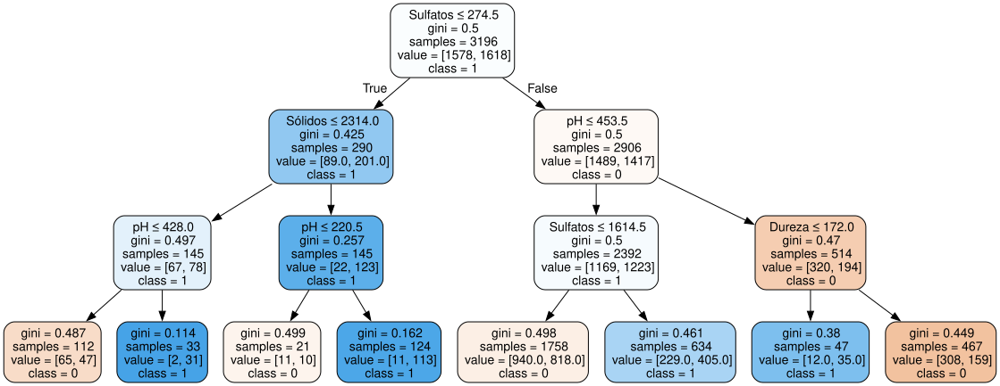

In [329]:
# Generar la representación gráfica del árbol de decision:

dot_data_AD3 = export_graphviz(model_AD3, out_file=None, 
                           feature_names=X_train.columns,  
                           class_names=['0', '1'],
                           filled=True, rounded=True,  
                           special_characters=True)

# Visualizar el árbol
graph = graphviz.Source(dot_data_AD3)  
graph



Interpretación del ARBOL:

Para la primera caja o nodo del arbol, el algoritmo solución encuentra que:

1. La primera decisión que el árbol toma es dividir los datos, y usa la variable Sulfatos ≤ 274.5, para esa primera división.
2. con GINI = 0.5 indica el coeficiente de Gini, el cual mide la "pureza" de la división; un valor de 0.5 significa que los datos están perfectamente divididos en este nodo.
3. con SAMPLES = 3196 se muestra el número total de registros en ese nodo
4. con VALUE = (1578, 1618) se determina el número de registros en cada clase; para nuestro ejemplo, se tendría entonces que 1578 muestras pertenecen a la clase '0' (NO POTABLE) y 1618 a la clase '1' (SI POTABLE).
5. con CLASS = 1 se indica que la clase que más prevalece en este nodo, en este caso, la clase '1' (SI POTABLE).

   


# 9. SECCIÓN FINAL: ANÁLISIS DE RESULTADOS

In [ ]:
¿Qué puedes decir de los valores de las métricas recall y precisión para cada una de las clases en cada modelo? ¿Cuál de estás métricas considera que es más importante con base en la descripción del problema?
 - 


In [ ]:
¿Considera que el rendimiento de los modelos es adecuado? Si no es así, ¿cómo podrían mejorarse los resultados?
 - 


In [ ]:
¿Cuáles son las variables más significativas según el mejor modelo basado en árboles de decisión? Reflexione sobre cómo este nuevo conocimiento podría ayudar a tomar decisiones en el contexto del problema.
 - 


In [ ]:
Si los cuatro modelos proporcionan resultados similares en cuanto
 - 